We're going to be calculating lexical diversity here. Pretty self explanatory stuff.

In [2]:
# these are the imports we'll be using
import nltk
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
import glob
import numpy as np
import numpy.linalg
import string
import book
from scipy.interpolate import interp1d
plt.style.use('seaborn-white')

In [3]:
# read in all the novels in the postmodern corpus
postmodern = []

for filename in glob.glob('postmodern/*.txt'):
    try:
        postmodern.append(book.makebook(open(filename, 'r')))
    except Exception as e:
        print(book)
        
postmodern.sort(key=lambda x: x.year)

In [4]:
# word tokenize all the books we read in in the previous block
postmodern_words = []

for book in postmodern:
    postmodern_words.append(word_tokenize(book.text.strip())) # strip removes string escapes
    
# now we'll make sure that things look like they were done correctly
postmodern_words[5][:6]

['A', 'SCREAMING', 'COMES', 'ACROSS', 'THE', 'SKY']

In [5]:
postmodern_lex_div = []

for book in postmodern_words:
    postmodern_lex_div.append(len(set(book)) / len(book))

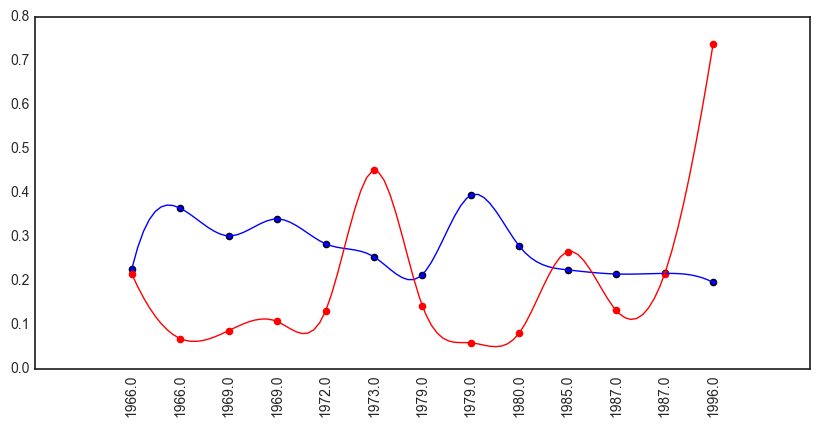

Mean length: 137902.41666666666
mean lexical diversity: 0.10904599062609503


In [6]:
dates = [book.year for book in postmodern]
x = np.arange(len(dates))
y = np.array(postmodern_lex_div)
y1 = np.array([len(book) for book in postmodern_words])
norm_y = y/np.linalg.norm(y)
norm_y1 = y1/np.linalg.norm(y1)
xlabel = dates

f_lex = interp1d(x, norm_y, kind='cubic')
x0 = np.linspace(0,len(dates)-1,100)
f_len = interp1d(x, norm_y1, kind='cubic')
x1 = np.linspace(0,len(dates)-1,100)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(211)
ax.scatter(x,norm_y)
ax.scatter(x,norm_y1, color='red')
ax.plot(x0, f_lex(x0),color='blue')
ax.plot(x1, f_len(x1), color='red')
plt.xticks(x, dates, rotation='vertical')
plt.show()
print('Mean length: {}'.format(np.mean(y1[:-1])))
print('mean lexical diversity: {}'.format(np.mean(y[:-1])))

Now for the Post 9/11 stuff...

In [7]:
post911 = []

for filename in glob.glob('post911/*.txt'):
    try:
        post911.append(book.makebook(open(filename, 'r')))
    except Exception as e:
        print(book)
        
post911.sort(key=lambda x: x.year)

post911_words = []

for book in post911:
    post911_words.append(word_tokenize(book.text.strip())) # strip removes string escapes
    
post911_lex_div = []

for book in post911_words:
    post911_lex_div.append(len(set(book)) / len(book))

['I', 'am', 'seated', 'in', 'an', 'office', ',', 'surrounded', 'by', 'heads', 'and', 'bodies', '.', 'My', 'posture', 'is', 'consciously', 'congruent', 'to', 'the', 'shape', 'of', 'my', 'hard', 'chair', '.', 'This', 'is', 'a', 'cold', 'room', 'in', 'University', 'Administration', ',', 'wood-walled', ',', 'Remington-hung', ',', 'double-windowed', 'against', 'the', 'November', 'heat', ',', 'insulated', 'from', 'Administrative', 'sounds', 'by', 'the', 'reception', 'area', 'outside', ',', 'at', 'which', 'Uncle', 'Charles', ',', 'Mr.', 'deLint', 'and', 'I', 'were', 'lately', 'received', '.', 'I', 'am', 'in', 'here', '.', 'Three', 'faces', 'have', 'resolved', 'into', 'place', 'above', 'summer-weight', 'sportcoats', 'and', 'half-Windsors', 'across', 'a', 'polished', 'pine', 'conference', 'table', 'shiny', 'with', 'the', 'spidered', 'light', 'of', 'an', 'Arizona', 'noon', '.', 'These', 'are', 'three', 'Deans', '—', 'of', 'Admissions', ',', 'Academic', 'Affairs', ',', 'Athletic', 'Affairs', '.',

In [ ]:
dates1 = [book.year for book in post911]
x = np.arange(len(dates1))
y = np.array(post911_lex_div)
y1 = np.array([len(book) for book in post911_words])
norm_y = y/np.linalg.norm(y)
norm_y1 = y1/np.linalg.norm(y1)
xlabel = dates1

f_lex = interp1d(x, norm_y, kind='cubic')
x0 = np.linspace(0,len(dates1)-1,100)
f_len = interp1d(x, norm_y1, kind='cubic')
x1 = np.linspace(0,len(dates1)-1,100)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(211)
ax.scatter(x,norm_y)
ax.scatter(x,norm_y1, color='red')
ax.plot(x0, f_lex(x0), color='blue')
ax.plot(x1, f_len(x1), color='red')
plt.xticks(x, dates1, rotation='vertical')
plt.show()
print('Mean length: {}'.format(np.mean(y1)))
print('mean lexical diversity: {}'.format(np.mean(y)))

Because lexical diversity is so clearly relative to the lenght of a text, we will examine diversity using the Yule-Herdan characteristic, which aims to filter out the noise created from length.